In [1]:
import numpy as np
import matplotlib.pyplot as plt
import librosa
import os

from IPython.display import Audio
from convex_nmf import separate_matrix, convex_nmf, initialize_kmeans
from utils import compute_sparsity

In [2]:
path = '/Users/jasonluo/Documents/JL School/ENEE469O/final_project/data_files/cello_violin_duet.wav'
mixed_signal, sample_rate = librosa.load(path, sr = None)
mixed_signal = mixed_signal[(sample_rate * 6):(sample_rate * 36)]
display(Audio(mixed_signal, rate = sample_rate))

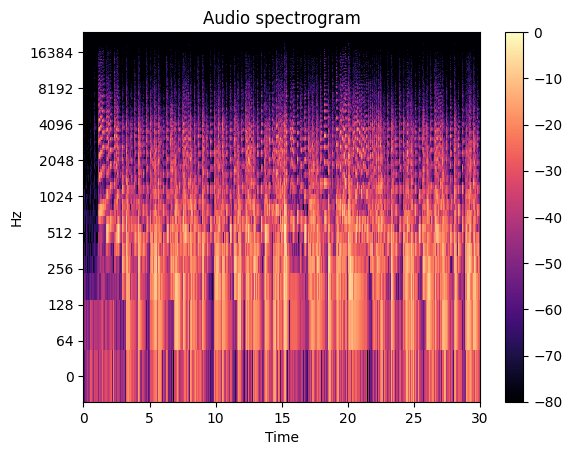

In [3]:
frame_length = 512
hop_length = int(frame_length * 0.25)
sound_stft = librosa.stft(mixed_signal, n_fft=frame_length, hop_length=hop_length)

sound_stft_Magnitude = np.abs(sound_stft)
sound_stft_Angle = np.angle(sound_stft) #Phase

#Plot Spectogram
Spec = librosa.amplitude_to_db(sound_stft_Magnitude, ref = np.max)
img = librosa.display.specshow(Spec,y_axis = 'log',sr=sample_rate,hop_length=hop_length,x_axis ='time')
plt.title('Audio spectrogram')
plt.colorbar(img)
plt.show()

  0%|          | 11/5000 [05:29<39:18:18, 28.36s/it]

Relative error at iteration 10: 0.003573879030801959


  0%|          | 21/5000 [10:36<41:11:32, 29.78s/it]

Relative error at iteration 20: 0.005973927247906552


  1%|          | 31/5000 [15:31<38:59:34, 28.25s/it]

Relative error at iteration 30: 0.006912730010568678


  1%|          | 41/5000 [20:12<38:04:35, 27.64s/it]

Relative error at iteration 40: 0.004708994255491892


  1%|          | 51/5000 [24:52<37:59:26, 27.64s/it]

Relative error at iteration 50: 0.0023996036452209536


  1%|          | 61/5000 [2:29:50<529:31:51, 385.97s/it]  

Relative error at iteration 60: 0.001205630854890227


  1%|▏         | 71/5000 [2:34:52<53:52:53, 39.35s/it]  

Relative error at iteration 70: 0.0006955716180712902


  2%|▏         | 81/5000 [2:39:34<39:04:36, 28.60s/it]

Relative error at iteration 80: 0.0004606128828371983


  2%|▏         | 91/5000 [2:45:03<44:48:54, 32.87s/it]

Relative error at iteration 90: 0.00033320248251253665


  2%|▏         | 101/5000 [2:49:57<39:59:00, 29.38s/it]

Relative error at iteration 100: 0.00025569942400106106


  2%|▏         | 111/5000 [2:55:05<40:22:47, 29.73s/it]

Relative error at iteration 110: 0.00020484241046836955


  2%|▏         | 121/5000 [2:59:54<40:34:55, 29.94s/it]

Relative error at iteration 120: 0.0001695268686978449


  3%|▎         | 131/5000 [3:04:57<39:55:42, 29.52s/it]

Relative error at iteration 130: 0.00014382764665096093


  3%|▎         | 141/5000 [3:09:42<38:07:39, 28.25s/it]

Relative error at iteration 140: 0.0001243024259491501


  3%|▎         | 151/5000 [3:15:42<47:03:35, 34.94s/it]

Relative error at iteration 150: 0.00010888216562113278


  3%|▎         | 157/5000 [3:19:31<102:34:43, 76.25s/it]

Convergence achieved at iteration 157...


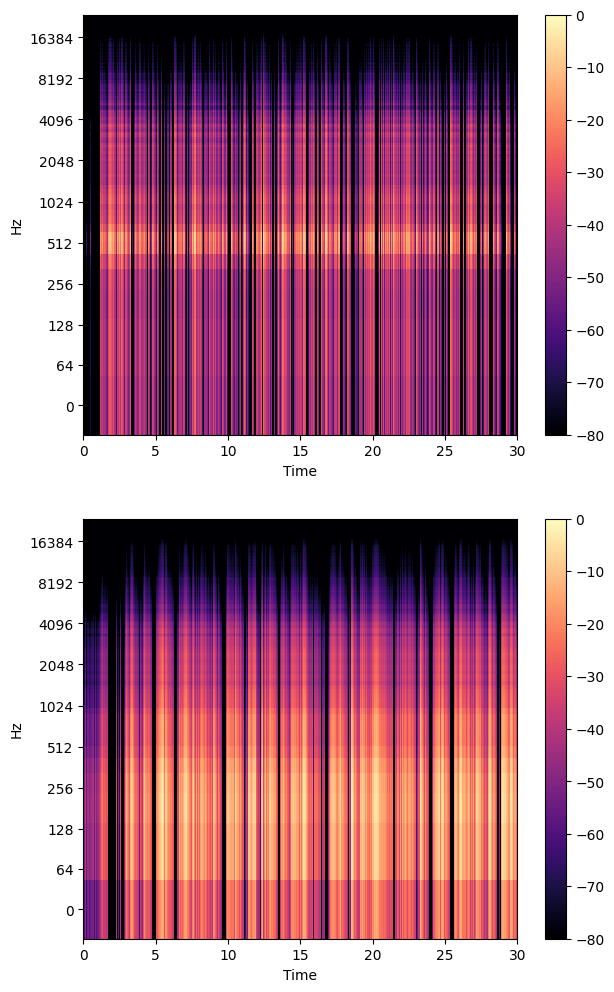

In [4]:
num_sources = 2
F, W, G_T, residual_vector = convex_nmf(sound_stft_Magnitude, num_sources, 1e-4, 5000, random_state=10)


# Constructing estimated filtered spectrograms
filtered_spectrograms = []
fig, axs = plt.subplots(num_sources, 1, figsize = [7, 12])
for i in range(0, num_sources):
    filtered_spectrogram = F[:,[i]] @ G_T[[i],:] # ith Column of W * ith row of H
    D = librosa.amplitude_to_db(filtered_spectrogram, ref = np.max)
    img = librosa.display.specshow(D,y_axis = 'log',sr=sample_rate,hop_length=hop_length,x_axis ='time', ax = axs[i])
    fig.colorbar(img)
    
    filtered_spectrograms.append(filtered_spectrogram)

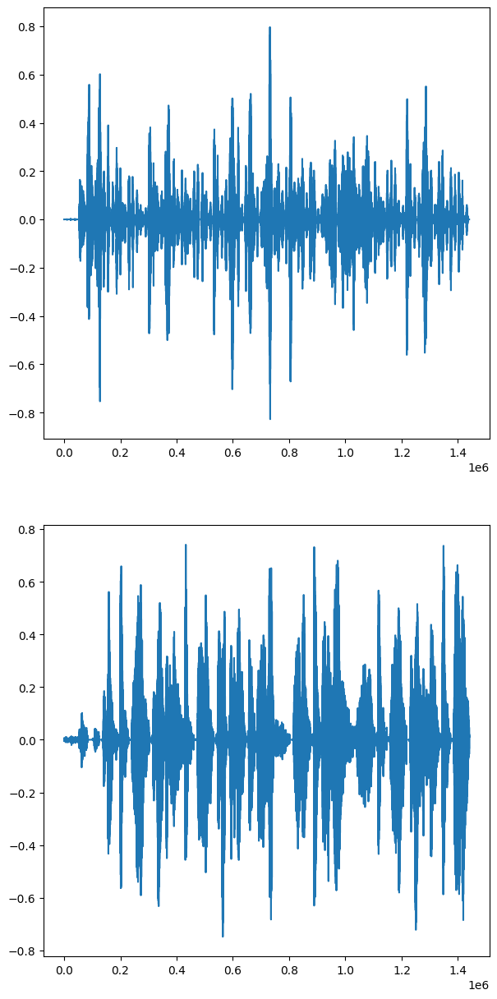

In [6]:
# Contructing source sounds using filtered spectograms and phase
new_sounds = []

fig, axs = plt.subplots(num_sources,1, figsize = [7,15])

for i in range(0, num_sources):
    reconstruct = filtered_spectrograms[i] * np.exp(1j*sound_stft_Angle)
    new_sound = librosa.istft(reconstruct, n_fft = frame_length, hop_length = hop_length)
    new_sounds.append(new_sound)
    axs[i].plot(new_sound)
    
    display(Audio(new_sounds[i], rate = sample_rate))